# Sparsify Image Classification Models Faster with SparseML and Deep Lake

[Deep Lake](https://github.com/activeloopai/deeplake) by Activeloop is a deep learning deep lake that stores data in an optimized format for deep learning leading to fast loading when training models. The Deep Lake dataset format is optimized for rapid streaming and data querying when training models at scale.



[SparseML](https://github.com/neuralmagic/sparseml) provides libraries for applying sparsification recipes to neural networks with a few lines of code, enabling faster and smaller models. SparseML does this while maintaining the model's accuracy. In this notebook, you will learn how to use Deep Lake and SparseML to sparsify an image classification model using ResNet. 


## Install Deep Lake and SparseML

In [ ]:
pip install deeplake

In [ ]:
pip install sparseml[torch]

## Download the dataset from Kaggle

In [ ]:
# Follow https://www.kaggle.com/general/156610 to authenticate your Kaggle account
!kaggle datasets download -d rashikrahmanpritom/plant-disease-recognition-dataset

In [ ]:
!unzip plant-disease-recognition-dataset.zip

## Import all the libraries

In [1]:
import deeplake
import os
import numpy as np
import random
from tqdm import tqdm
import torch
from torch.nn import Linear
from torch.nn import CrossEntropyLoss
from torch.optim import SGD
from sparseml.pytorch.models import resnet50
from sparseml.pytorch.optim import ScheduledModifierManager
import deeplake
from torchvision.transforms.functional import InterpolationMode
from torchvision import transforms
import time

/home/ubuntu/mwitisparse/lib/python3.8/site-packages/deeplake/util/check_latest_version.py:32: UserWarning: A newer version of deeplake (3.2.9) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


## Define function to load the data

The `ingest_random` function loads the data from the define folder randomly.

In [2]:
def ingest_random(src, dest, overwrite = False, token = None):
    
    # Find the subfolders, but filter additional files like DS_Store that are added on Mac machines.
    class_names = [item for item in os.listdir(src) if os.path.isdir(os.path.join(src, item))]
    files_list = []
    for dirpath, dirnames, filenames in os.walk(src):
        for filename in filenames:
            files_list.append(os.path.join(dirpath, filename))
    
    random.shuffle(files_list)
    
    ds = deeplake.empty(dest, overwrite = overwrite, token = token) 
    
    with ds:
        # Create the tensors with names of your choice.
        ds.create_tensor('images', htype = 'image', sample_compression = 'jpeg')
        ds.create_tensor('labels', htype = 'class_label', class_names = class_names)
        
        for file in tqdm(files_list):
            label_text = os.path.basename(os.path.dirname(file))
            label_num = class_names.index(label_text)
            #Append data to the tensors
            ds.append({'images': deeplake.read(file), 'labels': np.uint32(label_num)})
    
    return ds
    

In [3]:
token="YOUR_ACTIVELOOP_TOKEN" # If using the enterprise version of if you want to copy the data to the Actveloop Hub
src = 'Train/Train'
dest = 'plant_disease'
ds = ingest_random(src, dest, overwrite=True, token=token)


100%|██████████████████████████████████████| 1322/1322 [00:02<00:00, 473.86it/s]


## Display image sample from the data

In [4]:
from PIL import Image

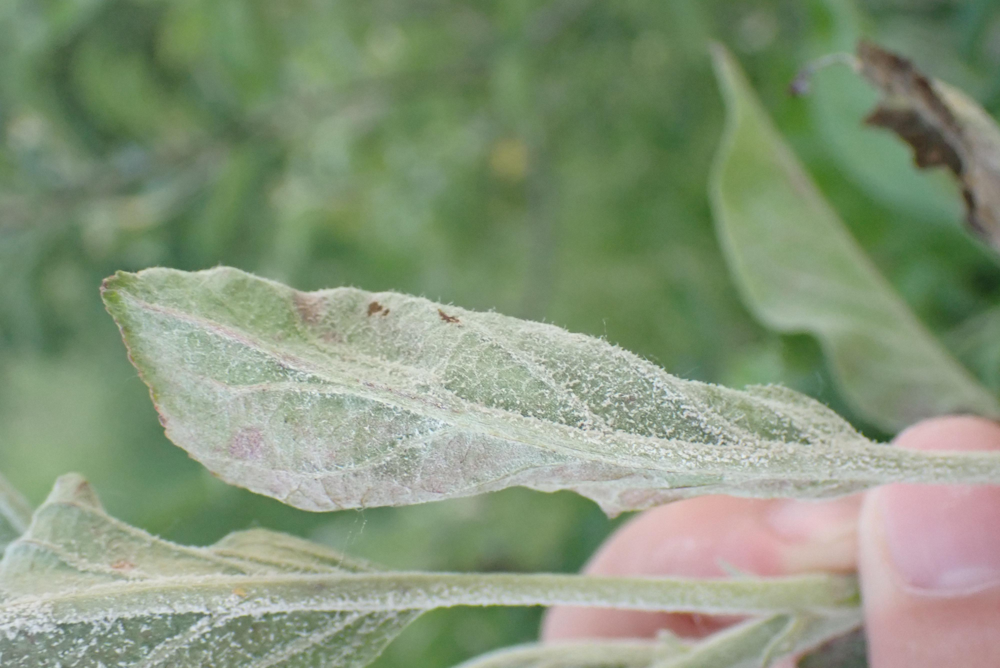

In [5]:
Image.fromarray(ds.images[10].numpy())

In [6]:
ds.summary()

Dataset(path='plant_disease', tensors=['images', 'labels'])

 tensor      htype                  shape                dtype  compression
 -------    -------                -------              -------  ------- 
 images      image     (1322, 1728:3456, 2421:5184, 3)   uint8    jpeg   
 labels   class_label             (1322, 1)             uint32    None   


## Create PyTorch data loader from the Deep Lake dataset 

To create a PyTorch data loader from the Deep Lake dataset, you first need to define some data transformations such as resizing the data and image augmentation. 

In [7]:
# Connect to the training and testing datasets
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
deeplake_image_column = "images"
deeplake_label_column = "labels"
batch_size = 32
interpolation = InterpolationMode.BILINEAR

In [8]:
# OSS
tform = transforms.Compose([
    transforms.RandomResizedCrop(224, interpolation=interpolation), 
    transforms.RandomRotation(20), # Image augmentation
    transforms.RandomHorizontalFlip(p=0.5), # Image augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])


train_loader = ds.pytorch(
            return_index=False,
            num_workers=0,

        shuffle=True,
            transform={
                deeplake_image_column: tform,
                deeplake_label_column: None,
            },
    
    
            batch_size=batch_size,
            decode_method={deeplake_image_column: "pil"},
    
        )

## Create the ResNet model using SparseML

In [9]:
# Model creation
NUM_CLASSES = len(ds[deeplake_label_column].info.class_names)
model = resnet50(pretrained=True, num_classes=NUM_CLASSES)

In [10]:
# Device setup
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

ResNet(
  (input): _Input(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU(inplace=True)
    (pool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (sections): Sequential(
    (0): Sequential(
      (0): _BottleneckBlock(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running

## SparseML Integration

Integrating SparseML is done by defining a `ScheduledModifierManager` that expects the path to the YAML containing the sparsification instructions, the model's optimizer and the number of steps per epoch. 

In [11]:
# SparseML Integration
# Recipe - in this case, we pull down a recipe from the SparseZoo for ResNet-50
# This can be a be a path to a local file
recipe_path = "zoo:cv/classification/resnet_v1-50/pytorch/sparseml/imagenet/pruned95_quant-none?recipe_type=original"
optimizer = SGD(model.parameters(), lr=10e-6, momentum=0.9)
manager = ScheduledModifierManager.from_yaml(recipe_path)
optimizer = manager.modify(model, optimizer, steps_per_epoch=len(train_loader))

The recipe used above looks like this:

```yaml
modifiers:
    - !GlobalMagnitudePruningModifier
        init_sparsity: 0.05
        final_sparsity: 0.8
        start_epoch: 0.0
        end_epoch: 30.0
        update_frequency: 1.0
        params: __ALL_PRUNABLE__

    - !SetLearningRateModifier
        start_epoch: 0.0
        learning_rate: 0.05

    - !LearningRateFunctionModifier
        start_epoch: 30.0
        end_epoch: 50.0
        lr_func: cosine
        init_lr: 0.05
        final_lr: 0.001

    - !QuantizationModifier
        start_epoch: 50.0
        freeze_bn_stats_epoch: 53.0

    - !SetLearningRateModifier
        start_epoch: 50.0
        learning_rate: 10e-6

    - !EpochRangeModifier
        start_epoch: 0.0
        end_epoch: 55.0



```

## PyTorch training loop

With all the building blocks in palce, the next step is to train the model normally in PyTorch. 

In [12]:
# Training Loop
start_time = time.perf_counter()
# Loss setup
criterion = CrossEntropyLoss()
for epoch in range(30):
    running_loss = 0.0
    running_corrects = 0.0
    for inputs, labels in train_loader:
        labels = torch.squeeze(labels)
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        with torch.set_grad_enabled(True):
            outputs, _ = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)
            loss.backward()
            optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects.double() / len(train_loader.dataset)
    print("Epoch {}: Training Loss: {:.4f} Acc: {:.4f}".format(epoch, epoch_loss, epoch_acc))
 
end_time = time.perf_counter()
duration = (end_time-start_time) * 1000.0
print(f"Sparse Deeplake Pipeline Took: {duration:.4f} ms")

Epoch 0: Training Loss: 3.4268 Acc: 0.5227
Epoch 1: Training Loss: 2.0465 Acc: 0.3449
Epoch 2: Training Loss: 1.5196 Acc: 0.3389
Epoch 3: Training Loss: 1.1653 Acc: 0.3782
Epoch 4: Training Loss: 1.1689 Acc: 0.4009
Epoch 5: Training Loss: 1.0459 Acc: 0.4546
Epoch 6: Training Loss: 0.8945 Acc: 0.5537
Epoch 7: Training Loss: 0.8592 Acc: 0.5764
Epoch 8: Training Loss: 0.8184 Acc: 0.6407
Epoch 9: Training Loss: 0.8369 Acc: 0.5885
Epoch 10: Training Loss: 0.9128 Acc: 0.6293
Epoch 11: Training Loss: 0.7420 Acc: 0.6997
Epoch 12: Training Loss: 0.5774 Acc: 0.8003
Epoch 13: Training Loss: 0.5300 Acc: 0.8071
Epoch 14: Training Loss: 0.5101 Acc: 0.8283
Epoch 15: Training Loss: 0.5177 Acc: 0.8200
Epoch 16: Training Loss: 0.4725 Acc: 0.8404
Epoch 17: Training Loss: 0.5035 Acc: 0.8359
Epoch 18: Training Loss: 0.4305 Acc: 0.8510
Epoch 19: Training Loss: 0.4064 Acc: 0.8707
Epoch 20: Training Loss: 0.4409 Acc: 0.8442
Epoch 21: Training Loss: 0.3715 Acc: 0.8805
Epoch 22: Training Loss: 0.3708 Acc: 0.864

In [13]:
manager.finalize(model)

## Export the trained model to ONNX

In [14]:
dummy_input = torch.randn(1, 3, 224, 224)

In [15]:
import os
import torch
from sparseml.pytorch.utils import ModuleExporter

exporter = ModuleExporter(model, output_dir=os.path.join(".", "."))
exporter.export_onnx(sample_batch=dummy_input)

## Deploy the model using DeepSparse

The ONNX model can then be deployed for fast inference using [DeepSparse](https://neuralmagic.com/deepsparse/). The DeepSparse inference runtime offers GPU-class performance on commodity CPUs. 

In [16]:
from deepsparse import Pipeline
cv_pipeline = Pipeline.create(
  task="image_classification",
  model_path="model.onnx",  # Path to checkpoint or SparseZoo stub
  class_names=None # optional dict / json mapping class ids to labels (if not using ImageNet classes)
)


DeepSparse, Copyright 2021-present / Neuralmagic, Inc. version: 1.3.2 COMMUNITY | (7d31c4bf) (release) (optimized) (system=avx2, binary=avx2)


In [17]:
input_image = "10007.jpg" # path to input image
inference = cv_pipeline(images=input_image)
inference

ImageClassificationOutput(labels=[2], scores=[8.457215309143066])

## Using SparseML with any data loader 

You can modify the [SparseML codebase](https://github.com/neuralmagic/sparseml/blob/main/src/sparseml/pytorch/torchvision/train.py#L370) to use any data loader. 

```diff
- train_dir = os.path.join(args.dataset_path, "train")
- val_dir = os.path.join(args.dataset_path, "val")
- dataset, dataset_test, train_sampler, test_sampler = load_data(train_dir, val_dir, args)
- data_loader = torch.utils.data.DataLoader(dataset, batch_size=args.batch_size,sampler=train_sampler, num_workers=args.workers,pin_memory=True,collate_fn=collate_fn,)
- data_loader_test = torch.utils.data.DataLoader(dataset_test,batch_size=args.batch_size,sampler=test_sampler,num_workers=args.workers, pin_memory=True, )
+ import deeplake 
+ ds = ingest_random(src, dest, overwrite=True, token=token)
+ tform = transforms.Compose([transforms.RandomResizedCrop(224, interpolation=interpolation),  transforms.RandomRotation(20), # Image augmentation transforms.RandomHorizontalFlip(p=0.5), # Image augmentationtransforms.ToTensor(),transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),])
+ data_loader = ds.pytorch( return_index=False, shuffle=True,transform={deeplake_image_column: tform, deeplake_label_column: None, }, batch_size=batch_size, decode_method={deeplake_image_column: "pil"}, )
+ data_loader_test = ds.pytorch( return_index=False, shuffle=True,transform={deeplake_image_column: tform, deeplake_label_column: None, }, batch_size=batch_size, decode_method={deeplake_image_column: "pil"}, )
```

## Next steps 
[Join our community](https://join.slack.com/t/discuss-neuralmagic/shared_invite/zt-q1a1cnvo-YBoICSIw3L1dmQpjBeDurQ) to interact with other deep learning practitioners and get your questions answered or [submit and issue on GitHub](https://github.com/neuralmagic/sparseml/issues). 
